In [7]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [8]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model

baseModel = MobileNetV2(weights="imagenet", include_top=False,input_tensor=Input(shape=(224,224, 3)))

headModel = baseModel.output
headModel = AveragePooling2D(pool_size=(4, 4))(headModel)
headModel = Flatten(name="flatten")(headModel)
headModel = Dense(128, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(2, activation="softmax")(headModel)


model = Model(inputs=baseModel.input, outputs=headModel)

for layer in baseModel.layers:
    
    layer.trainable = False

model.compile(loss="categorical_crossentropy", optimizer='adam',metrics=["accuracy"])


In [9]:
model.load_weights('/content/drive/MyDrive/Identify patches in concrete project/weights/weights-026.h5')

In [10]:
import numpy as np
test_data=np.load('/content/drive/MyDrive/Identify patches in concrete project/test_data_unscaled.npy')
test_target=np.load('/content/drive/MyDrive/Identify patches in concrete project/test_target.npy')
test_data_scaled=test_data/255

In [11]:
print(model.evaluate(test_data_scaled,test_target))

7/7 [==============================] - 1s 28ms/step - loss: 0.0044 - accuracy: 1.0000
[0.004282716196030378, 1.0]


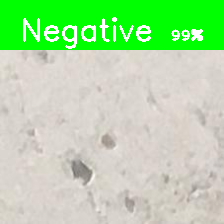

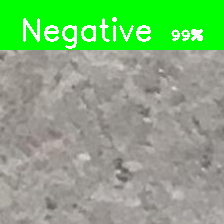

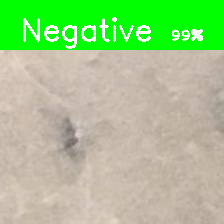

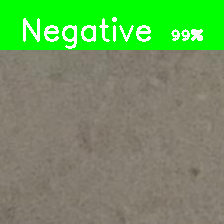

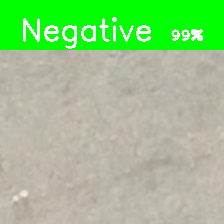

...

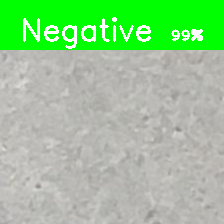

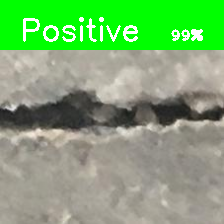

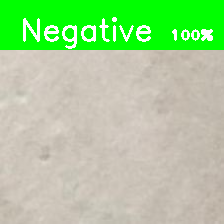

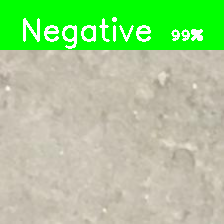

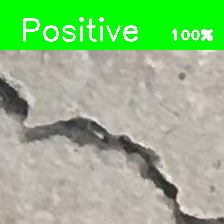

In [12]:
import os
import cv2
import numpy as np
from google.colab.patches import cv2_imshow




category_dict={0:'Negative',1:'Positive'}

for img in test_data:
    
    h,w=img.shape[0:2]

    
    scaled_img=img/255
    scaled_img=scaled_img.reshape(1,img.shape[0],img.shape[1],img.shape[2])
    
    results=model.predict(scaled_img)
    label=np.argmax(results,axis=1)[0]
    acc=int(np.max(results,axis=1)[0]*100)
    
    
    img[0:50,0:w]=[0,255,0]
    cv2.putText(img,category_dict[label],(20,40),cv2.FONT_HERSHEY_SIMPLEX,1,(255,255,255),2)
    cv2.putText(img,str(acc)+'%',(170,40),cv2.FONT_HERSHEY_PLAIN,1,(255,255,255),2)
    
    cv2_imshow(img)
    print('=======================================')
    k=cv2.waitKey(1000)
    if(k==27):
        break
cv2.destroyAllWindows()